# The Task

Find a risky transaction that will become a chargeback (state=chargeback or refund+fees)

Enclosed are 
- Transactions with their meta data
- Subscriptions, Each transaction create a subscription object
- User attributes, what we collected about a user

User identified by ClientID and by a GUID (a PC unique stamp, usually 1 pc = 1 user)

There is a lot of extra info that may or may not be used

Transactions https://fast-test-datasci.s3.amazonaws.com/trans.rar

Subscriptions https://fast-test-datasci.s3.amazonaws.com/ccsubs.rar

User Attribute https://fast-test-datasci.s3.amazonaws.com/attr.rar

## >Використані бібліотеки

In [1]:
from sklearn import datasets
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import sklearn
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import make_pipeline
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier, plot_tree

## >Завантаження даних 

In [2]:
df1 = pd.read_csv('Атрибут користувача 1.csv')

In [3]:
df2 = pd.read_csv('Атрибут користувача 2.csv')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_8644\3186476912.py:1: DtypeWarning: Columns (52) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv('Атрибут користувача 2.csv')


In [4]:
df3 = pd.read_csv('Атрибут користувача 3.csv')

In [5]:
df4 = pd.read_csv('Атрибут користувача 4.csv')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_8644\4185521652.py:1: DtypeWarning: Columns (17) have mixed types. Specify dtype option on import or set low_memory=False.
  df4 = pd.read_csv('Атрибут користувача 4.csv')


In [6]:
df5 = pd.read_csv('Атрибут користувача 5.csv')

In [7]:
transac = pd.read_csv('Transactions.txt', delimiter='\t')

C:\Users\BU400A\AppData\Local\Temp\ipykernel_8644\2270557742.py:1: DtypeWarning: Columns (0,1,2,6,7,14,16) have mixed types. Specify dtype option on import or set low_memory=False.
  transac = pd.read_csv('Transactions.txt', delimiter='\t')


In [8]:
ccsubs = pd.read_csv('CC and subscriptions.txt', delimiter='\t')

## >Виведення основної інформації про дані

In [164]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3747 entries, 0 to 3746
Columns: 148 entries, id to d
dtypes: float64(15), int64(70), object(63)
memory usage: 4.2+ MB


In [165]:
df1.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,4568921,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15) ...,24.140.168.18,US,Massillon,OH,Ohio,America/New_York,240,{},200210
1,4569179,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,92.5.101.53,GB,Doncaster,DNC,Doncaster,Europe/London,-60,{},200210
2,4569217,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,86.162.82.27,GB,Morpeth,NBL,Northumberland,Europe/London,-60,{},200210
3,4337476,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,73.53.100.16,US,Auburn,WA,Washington,America/Los_Angeles,420,{},200210
4,4569451,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,73.206.136.220,US,Houston,TX,Texas,America/Chicago,300,{},200210


In [166]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4659 entries, 0 to 4658
Columns: 148 entries, id to d
dtypes: float64(15), int64(71), object(62)
memory usage: 5.3+ MB


In [12]:
df2.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,11896214,https://www.bing.com/,bing.com,www.bing.com/,topav_au,topav_au,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,110.140.32.76,AU,Melbourne,VIC,Victoria,Australia/Melbourne,-600,{},210527
1,12079640,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww,wdl_fa_ww,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,118.210.63.201,AU,Blackwood,SA,South Australia,Australia/Adelaide,-15450,{},200610
2,12115595,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww_mcf,wdl_fa_ww_mcf,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,174.219.3.189,US,Saint Paul,MN,Minnesota,America/Chicago,300,{},210827
3,4676792,-,NaN,NaN,activeTrail,em_msoffice_1_1,NaN,opt10000d,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,66.249.84.184,US,Spruce Grove,AB,Alberta,America/Edmonton,780,{},200417
4,11949247,https://googleads.g.doubleclick.net/pagead/ads...,popsilla.com,www.popsilla.com/au.com.kayosports,wdl_2x2min,wdl_2x2min,NaN,software,1,2,...,Mozilla/5.0 (Windows NT 6.1; WOW64; Trident/7....,49.199.16.62,AU,Richmond,VIC,Victoria,Australia/Melbourne,-600,{},210620


In [13]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4055 entries, 0 to 4054
Columns: 148 entries, id to d
dtypes: float64(14), int64(71), object(63)
memory usage: 4.6+ MB


In [14]:
df3.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,28977539,https://www.google.com/,google.com,www.google.com/,telegram_search,telegram_search,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,102.165.48.100,US,Washington,DC,District of Columbia,America/New_York,240,"{""mac"": {""gateway"": ""C8EAF849F00E"", ""net_local...",221012
1,10185115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,141.226.140.100,US,Copenhagen,84,Capital Region,Europe/Copenhagen,-120,{},201127
2,11065006,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww3,wdl_fa_ww3,businessProductivitySoftware,mobileEnthusiasts,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,99.228.247.235,CA,Maple,ON,Ontario,America/Toronto,540,{},201227
3,11088770,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,sms,zzy,NaN,NaN,0,4,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,1.157.9.60,AU,Gungahlin,ACT,Australian Capital Territory,Australia/Sydney,-600,{},210106
4,11090271,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdy,wdy,businessProductivitySoftware,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,99.6.232.251,US,Dallas,TX,Texas,America/Chicago,300,{},210106


In [15]:
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5116 entries, 0 to 5115
Columns: 148 entries, id to d
dtypes: float64(17), int64(71), object(60)
memory usage: 5.8+ MB


In [16]:
df4.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,26642248,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww4,wdl_fa_ww4,NaN,NaN,1,1,...,Mozilla/5.0 (Windows NT 10.0) AppleWebKit/537....,99.247.34.202,CA,Mississauga,ON,Ontario,America/Toronto,300,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.17""}...",220222
1,26642423,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,1,...,Mozilla/5.0 (Windows NT 6.1) AppleWebKit/537.3...,184.144.155.15,CA,Salaberry-de-Valleyfield,QC,Quebec,America/Toronto,300,"{""mac"": {""gateway"": ""C03C041D5768"", ""net_local...",220222
2,26642479,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,1.158.56.45,AU,Annandale,NSW,New South Wales,Australia/Sydney,-660,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222
3,26642817,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_ww4,wdl_fa_ww4,androidApps,HostedDataCloudStorage,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,108.180.15.39,CA,Campbell River,BC,British Columbia,America/Vancouver,900,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222
4,26642837,https://googleads.g.doubleclick.net/,googleads.g.doubleclick.net,googleads.g.doubleclick.net/,wdl_fa_legacy,wdl_fa_legacy,NaN,mcafeeOffice,1,2,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,58.168.208.94,AU,Chatswood,NSW,New South Wales,Australia/Sydney,-660,"{""ip"": {""iprisk"": ""0.01"", ""riskscore"": ""0.1""},...",220222


In [17]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3848 entries, 0 to 3847
Columns: 148 entries, id to d
dtypes: float64(16), int64(70), object(62)
memory usage: 4.3+ MB


In [18]:
df5.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,4928742,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,NaN,69.147.90.254,US,Lake Oswego,OR,Oregon,America/Los_Angeles,420,{},200516
1,7812729,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_4_1 like...,184.148.36.66,CA,St. Catharines,ON,Ontario,America/Toronto,240,{},200516
2,9757139,https://googleads.g.doubleclick.net/pagead/ads...,appdirectory.online,www.appdirectory.online/download/itunes/,wdl_fa_ww,wdl_fa_ww,NaN,software,1,1,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,134.41.223.52,CA,Bay Roberts,NL,Newfoundland and Labrador,America/St_Johns,150,{},200516
3,4804078,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,70.120.213.17,US,Uvalde,TX,Texas,America/Chicago,300,{},200516
4,4802995,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,69.147.90.62,US,Mountain Ranch,CA,California,America/Los_Angeles,720,{},200518


In [37]:
transac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92167 entries, 0 to 92166
Data columns (total 19 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   id               92167 non-null  object 
 1   customer_id      92167 non-null  object 
 2   subscription_id  92167 non-null  object 
 3   guid             91609 non-null  object 
 4   email            90421 non-null  object 
 5   geo              91695 non-null  object 
 6   amount           92166 non-null  object 
 7   returns          92166 non-null  object 
 8   item_name        91927 non-null  object 
 9   item_key         80821 non-null  object 
 10  campaign         76931 non-null  object 
 11  state            92120 non-null  object 
 12  created_time     92165 non-null  float64
 13  provider         92161 non-null  object 
 14  oid              39268 non-null  object 
 15  descriptor       65556 non-null  object 
 16  strategy_id      40839 non-null  object 
 17  strategy_con

In [167]:
transac.head()

,id,customer_id,subscription_id,guid,email,geo,amount,returns,item_name,item_key,campaign,created_time,provider,oid,descriptor,strategy_id,strategy_config,json,state
0,11,7,0,03000200-0400-0500-0006-000700080009,email@btinternet.com,IL,2.95,0,Fast! (monthly),NaN,batch001,1.489680e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""5"", ""chk"": ""1FE690276694C82917A14E5CD1...",0
1,13,9,0,B9B14F7F-76FC-11DD-B661-DDA0BF0C50C1,email@eletewireless.co.za,ZA,2.95,0,Fast! (monthly),NaN,NaN,1.489919e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""7"", ""chk"": ""D170AA7E27F35C557F7B1298CC...",0
2,14,10,0,2A183F20-3890-11DF-9257-7071BC05CE48,email@iafrica.com,ZA,49.95,0,Fast! (annual),NaN,NaN,1.490161e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""8"", ""chk"": ""EBA378D55BE333A21804A32ABF...",0
3,15,11,0,30464E43-3035-5838-3636-78ACC049073C,email@hotmail.com,TR,2.95,0,Fast! (monthly),NaN,NaN,1.490196e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""9"", ""chk"": ""EC1F5BE747C6562C1B4CCCD690...",0
4,16,12,0,515F4572-DBEC-CB41-A8CD-2EF2BEAB71DE,email@gmail.com,MY,2.95,0,Fast! (monthly),NaN,NaN,1.490203e+09,UpClick,NaN,NaN,NaN,{},"{""id"": ""10"", ""chk"": ""DA8E21E922F97C1F5D5E259E7...",0


In [21]:
ccsubs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60932 entries, 0 to 60931
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id                 60932 non-null  int64  
 1   customer_id        60932 non-null  int64  
 2   guid               60931 non-null  object 
 3   page               56994 non-null  object 
 4   shopper_id         48485 non-null  float64
 5   created_time       60932 non-null  int64  
 6   last_billing_time  60932 non-null  int64  
 7   next_billing_time  60932 non-null  int64  
 8   amount             60932 non-null  float64
 9   ltv                60932 non-null  float64
 10  interval_sec       60932 non-null  int64  
 11  state              60932 non-null  object 
 12  retry_count        60932 non-null  int64  
 13  descriptor         54993 non-null  object 
 14  meta_data          60932 non-null  object 
 15  log_json           60932 non-null  object 
 16  strategy_id        370

In [168]:
ccsubs.head()

,id,customer_id,guid,page,shopper_id,created_time,last_billing_time,next_billing_time,amount,ltv,interval_sec,retry_count,descriptor,meta_data,log_json,strategy_id,strategy_config,state
0,1,44444,FAB0479A-96FD-4F73-9FBE-B418C9F47B69,NaN,116923660.0,1601072965,1603665060,1603837860,9.99,139.86,2592000,1,NaN,{},"[\n {\n ""time"": 1567028797,\n ...",NaN,{},1
1,3,44493,1DC99082-1185-11DF-BBDA-85804582D8D3,NaN,117013344.0,1577488083,1577488083,1580080083,9.99,49.95,2592000,0,NaN,{},"[{""time"":1567119645,""comment"":""success purchas...",NaN,{},2
2,4,44510,35444335-3334-4B35-3956-B05ADADD0E80,NaN,117180938.0,1596786634,1596786634,1596786387,9.99,109.89,2592000,5,NaN,{},"[\n {\n ""time"": 1567187352,\n ...",NaN,{},3
3,5,44513,4C4C4544-0030-3910-8044-B9C04F545231,NaN,118633050.0,1574982120,1574982120,0,9.99,29.97,2592000,12,NaN,{},"[{""time"":1568255087,""comment"":""success purchas...",NaN,{},3
4,6,44599,4C4C4544-004E-4710-8034-C6C04F475432,NaN,117852486.0,1572824502,1572824502,0,4.99,14.97,2592000,10,NaN,{},"[{""time"":1567640136,""comment"":""success purchas...",NaN,{},3


_Бачимо, що дані у 5-ти дата-фреймах "Атрибути користувача" містять однакову кількість колонок (148) з однаковою назвою, а дата-фрейми з підписками та транзакціями містять велику кількість стрічок і різну кількість стовпчиків.  
Стопці у дата-фреймах представлені у форматах float64, int64 та object. Дані містять пропущені значення у деяких стовпчиках._

## Оскільки за умовою завдання необхідно знайти ризиковану транзакцію, яка стане поверненням платежу (state=chargeback or refund+fees), то у дата-фреймах "transac" та "ccsubs" колонка 'state' є цільовим значенням і тому необхідно змінити тип даних цієї колонки з object на int64.

#### Виведення унікальних значень у даному стовці у двох датасетах

In [9]:
transac['state'].unique()

array(['Completed', 'Pending', 'Decline', 'Refund', 'Reversed',
       'ChargeBack', 'CancelRebill', 'UpdateCustomer', 'Rebill',
       'Canceled_Reversal', 'rebill', 'sale', nan, 'subscr_signup',
       'UpdateRebill', 'CreditCardProfileUpdated', 'CANCELLATION',
       'CANCELLATION_REFUND', 'DECLINE', 'RECURRING', 'Won-ChargeBack',
       'Canceled', 'Failed'], dtype=object)

In [10]:
ccsubs['state'].unique()

array(['declined', 'canceled', 'failed', 'recurring', 'once',
       'processing', 'free'], dtype=object)

#### Перевірка відсоткової кількості пропущених значень у стовпці 'state' у дата-фреймі 'transac'

In [11]:
transac.isna().sum().div(transac.shape[0]).mul(100).round(2)['state']

0.05

_Оскільки у стовпці state пропущених значень всього 0.05%, то варто змінити пропуски. Оскільки колонка 'state' є по суті цілью завдання (target), і я не знаю яке із значень найбільш підходить для заміщення пропущеного значення, то можна або видалити рядки із пропущеними значення у стовці 'state' або замінити на найчастіше зустрічаюче значення у стовпці. Я обираю замінити пропущені значення на mode, що не вплине на загальну картину даних._

In [12]:
transac['state'] = transac['state'].fillna(transac['state'].mode()[0])

### За результатом аналізу даних у колонках 'state' у дата-фреймах "transac" та "ccsubs" приходжу до висновку, що необхідна target знаходиться у дата-фреймі "transac", при чому мене цікавлять ризикові значення 'Refund', 'ChargeBack', 'CANCELLATION_REFUND', 'Won-ChargeBack', решта не є ціллю завдання. Тому вказаним значенням присвою 1, а решті 0. Що стосується колонки 'state' у дата-фреймі "ccsubs", то значення перетворю і різні цілі числа.

In [13]:
transac['state_cod'] = transac['state'].map({'Completed':0, 'Pending':0, 'Decline':0, 'Refund':1, 'Reversed':0,
                                           'ChargeBack':1, 'CancelRebill':0, 'UpdateCustomer':0, 'Rebill':0,
                                           'Canceled_Reversal':0, 'rebill':0, 'sale':0, 'subscr_signup':0,
                                           'UpdateRebill':0, 'CreditCardProfileUpdated':0, 'CANCELLATION':0,
                                           'CANCELLATION_REFUND':1, 'DECLINE':0, 'RECURRING':0, 'Won-ChargeBack':1,
                                           'Canceled':0, 'Failed':0})

In [14]:
ccsubs['state_cod'] = ccsubs['state'].map({"declined":1, "canceled":2,
                                            "failed":3,  "recurring":4, "once":5,
                                            "processing":6, "free":7})

##### Видалення перетвореного стовпця "state" у таблицях транзакцій та підписок

In [15]:
ccsubs.drop(columns=['state'], inplace=True)

In [16]:
transac.drop(columns=['state'], inplace=True)

##### Перейменування нового створеного стовпця "state_cod" у назву 'state' у таблицях транзакцій та підписок

In [17]:
ccsubs.columns = ccsubs.columns.map(lambda x: x.replace("state_cod", "state"))

In [18]:
transac.columns = transac.columns.map(lambda x: x.replace("state_cod", "state"))

## >Попередній статестичний аналіз даних та їх візуалізація

### Виведення скатер-плотів, які показують розподіл підписок

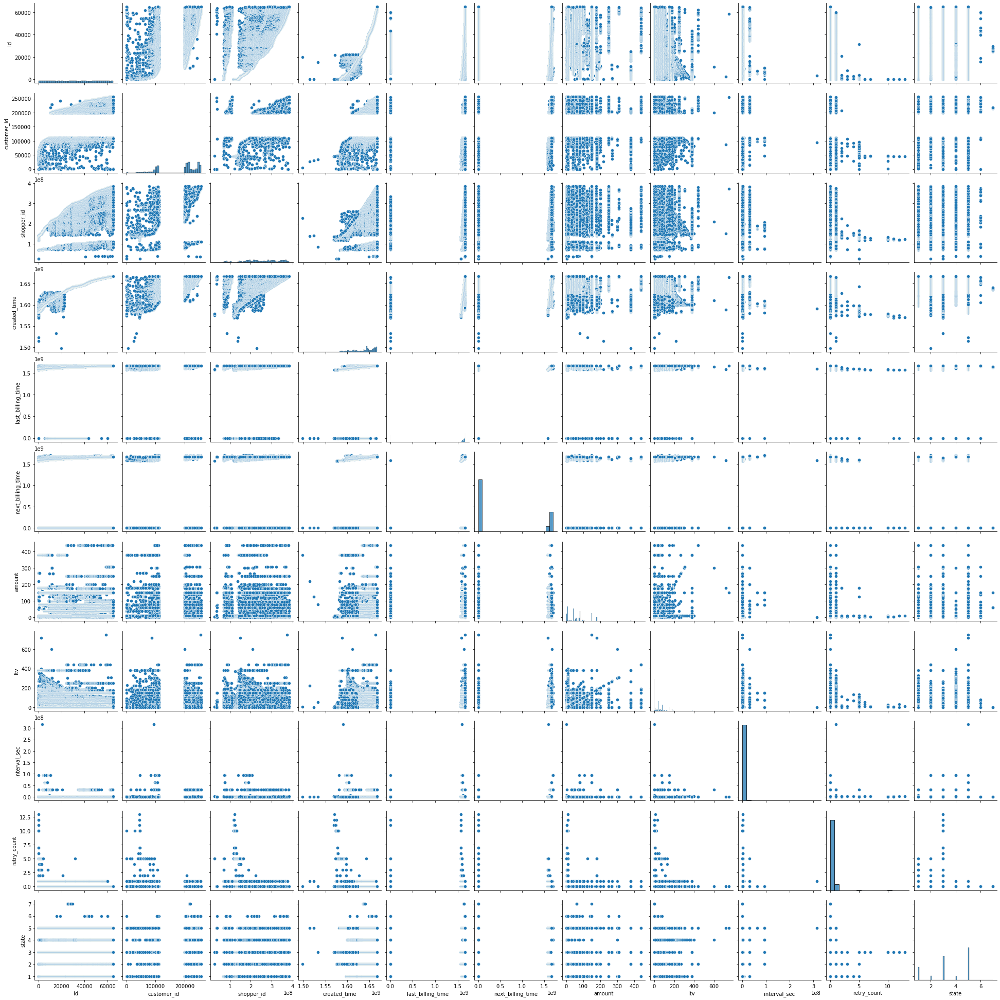

In [49]:
sns.pairplot(ccsubs) 
plt.show()

_Виведення візуалізацій зазвичай може надати можливість зробити перші статистичні висновки, однак в нашому випадку це не дуже інформатвно із pairplot.
Для нашої задачі є сенс дивитися на графіки розсіювання між цільовою змінною та кожним признаком окремо (незалежна змінна)._

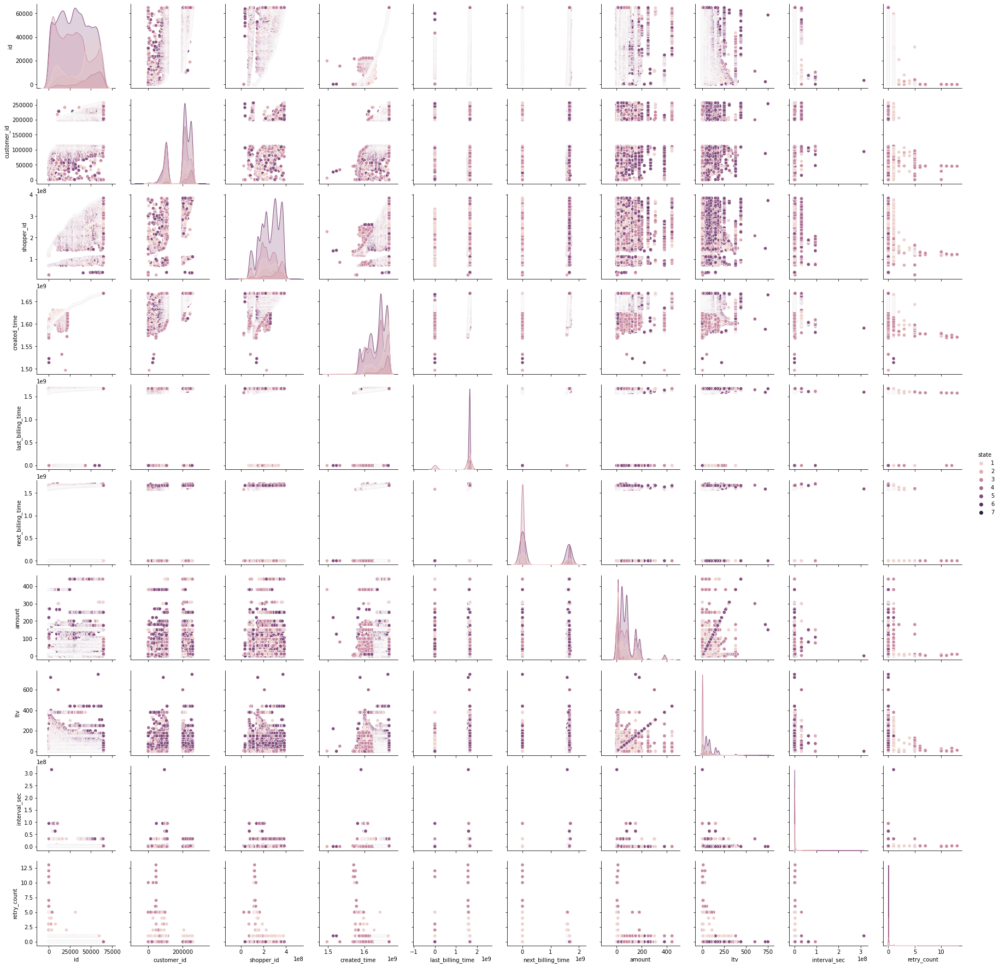

In [51]:
sns.pairplot(ccsubs, hue='state')
plt.show()   

_Для нашої задачі розділяємо кольором цільову змінну та інші на скатер-плоті,   
Інтенсивність кольру (від слабкішого до більш насиченого) по видам стану підписок ("declined":1, "canceled":2, "failed":3,  "recurring":4, "once":5,"processing":6, "free":7)._

### Виведення скатер-плотів, які показують розподіл транзакцій

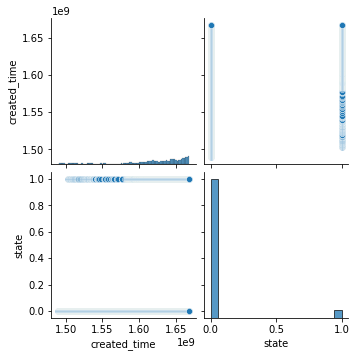

In [52]:
sns.pairplot(transac) 
plt.show()

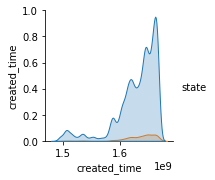

In [53]:
sns.pairplot(transac, hue='state')
plt.show()  

_Нажаль pairplot із таблицею "transac" не несе великого інформаційного навантаження, оскільки всі стовпці, крім двох мають формат  object, і дані потребують подальшої обробки._

_pairplot з дата-фреймами df1-df5 у мене не завантажуться у звязку з великим об'ємом пам'яті (нажаль комп'ютер не витягує)._

### Теплова карта з допомогою Сіборновського "heatmap"

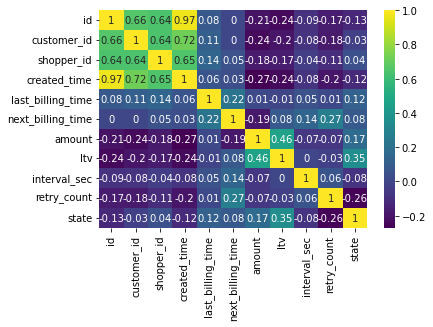

In [54]:
sns.heatmap(ccsubs.corr().round(2), annot=True, cmap='viridis')
plt.show()

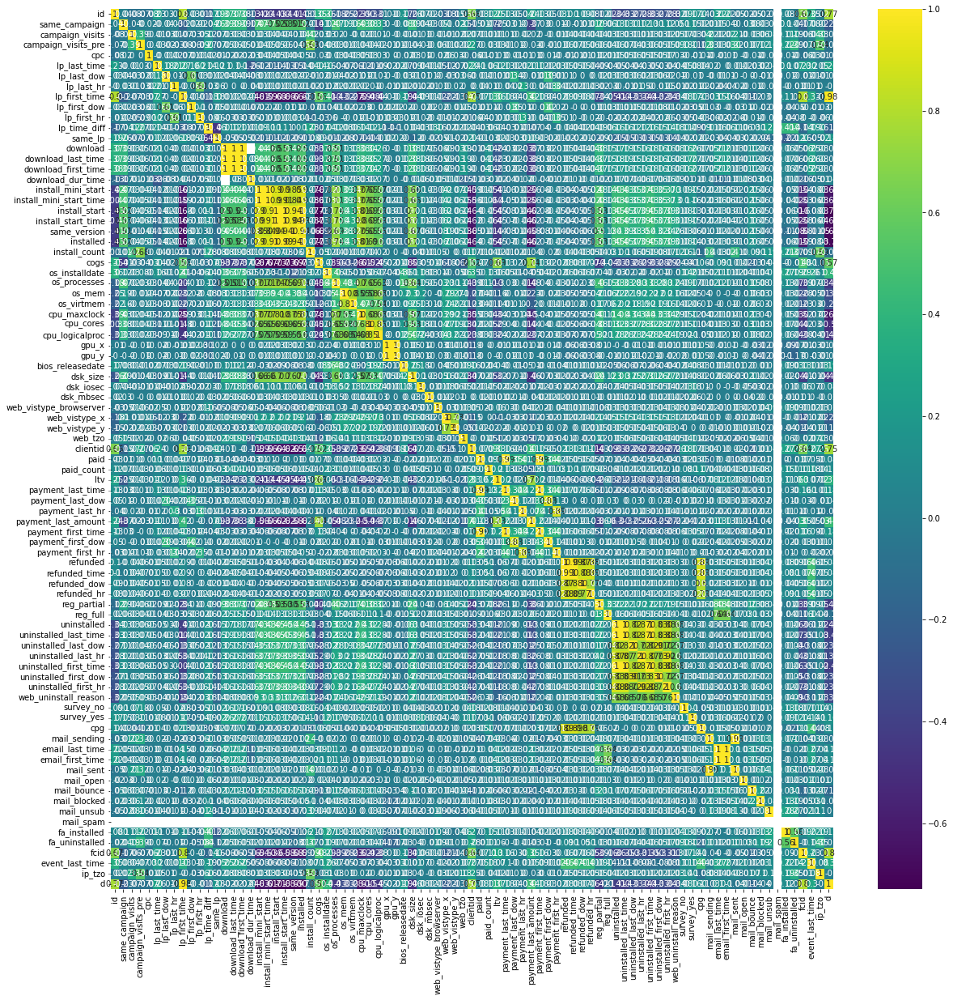

In [55]:
plt.figure(figsize=(20, 20))
sns.heatmap(df1.corr().round(2), annot=True, cmap='viridis')
plt.show()

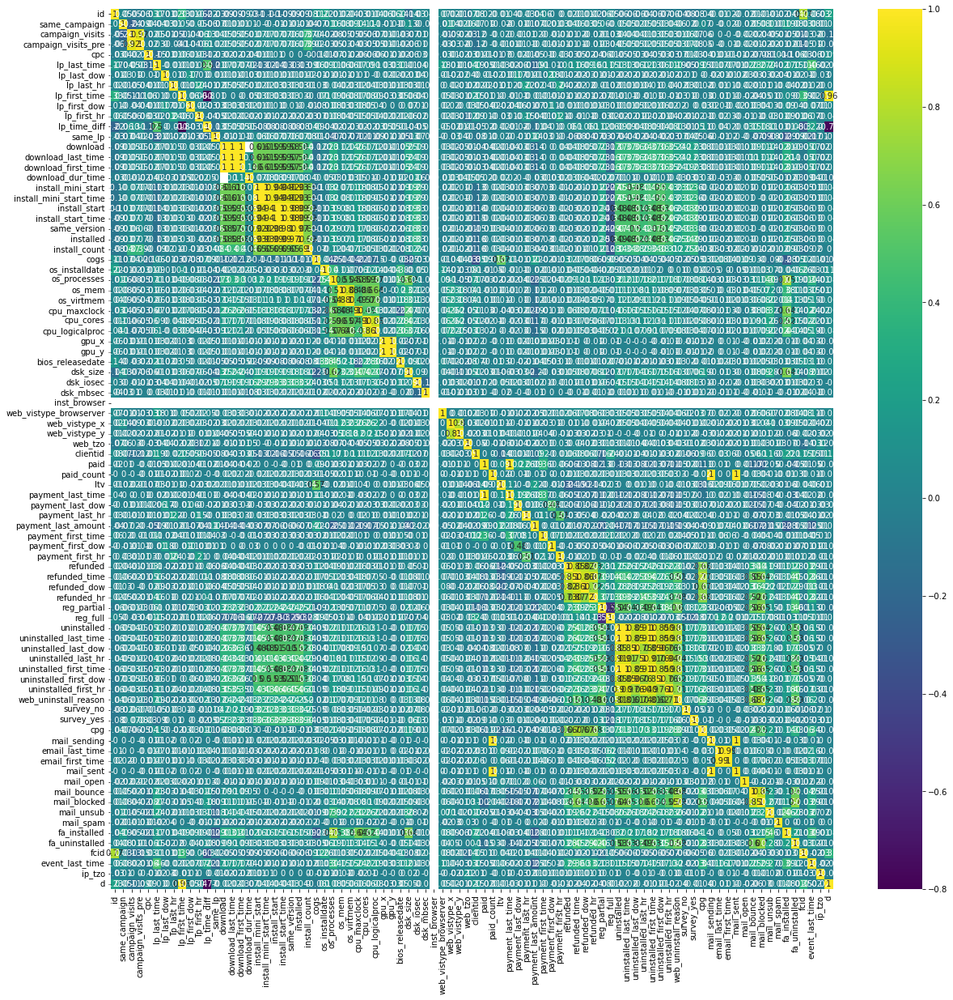

In [56]:
plt.figure(figsize=(20, 20))
sns.heatmap(df2.corr().round(2), annot=True, cmap='viridis')
plt.show()

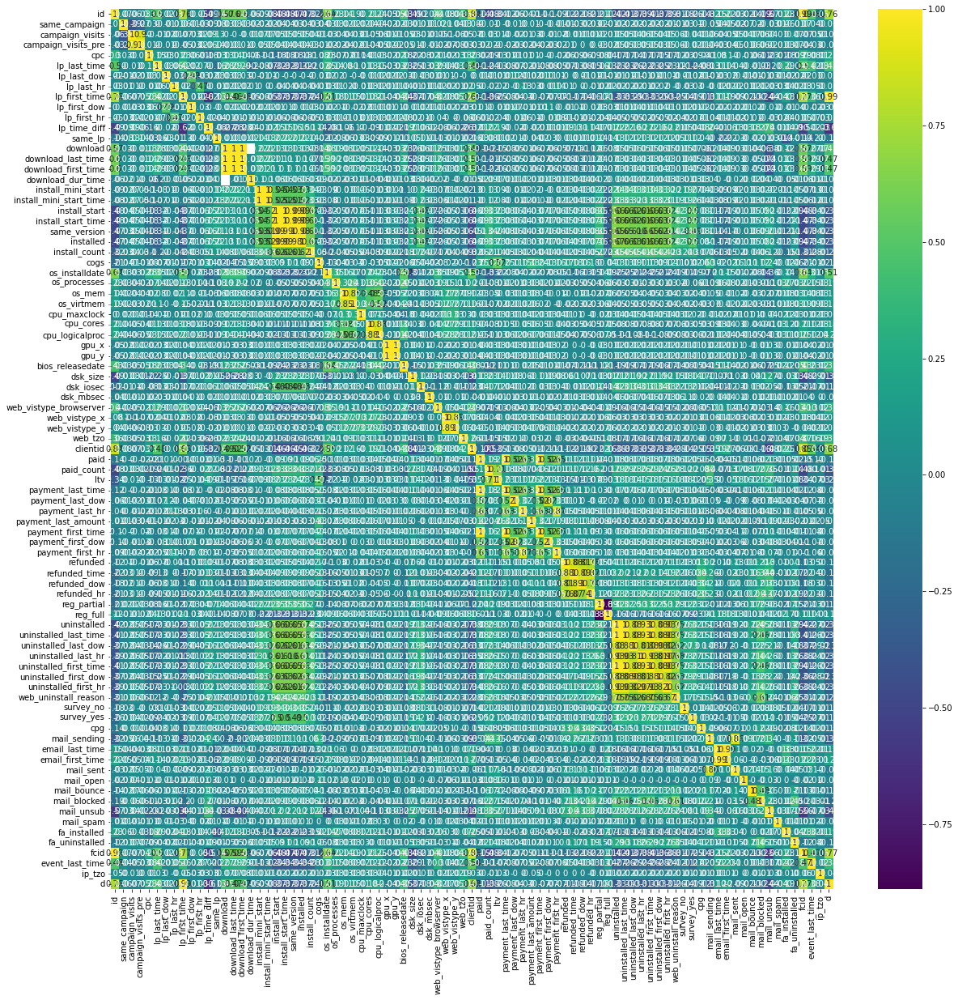

In [57]:
plt.figure(figsize=(20, 20))
sns.heatmap(df3.corr().round(2), annot=True, cmap='viridis')
plt.show()

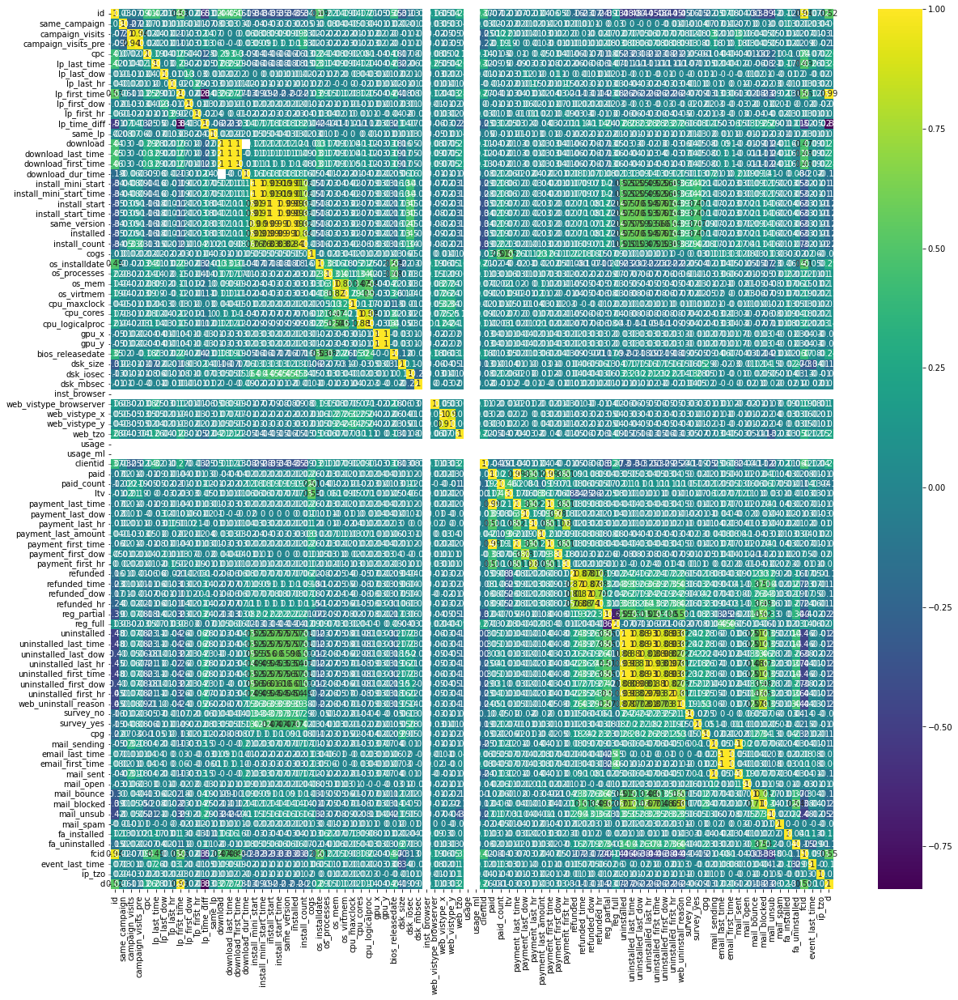

In [58]:
plt.figure(figsize=(20, 20))
sns.heatmap(df4.corr().round(2), annot=True, cmap='viridis')
plt.show()

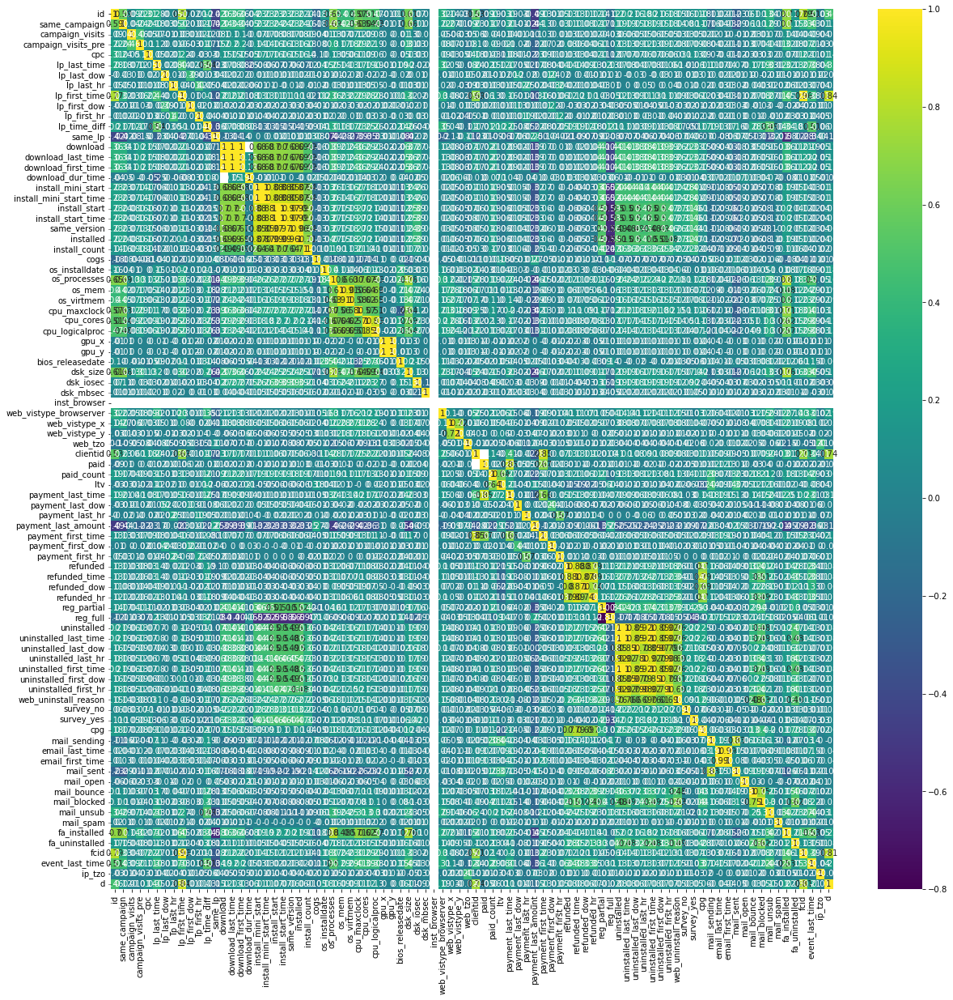

In [59]:
plt.figure(figsize=(20, 20))
sns.heatmap(df5.corr().round(2), annot=True, cmap='viridis')
plt.show()

_Теплові карти кореляції показують приблизно те ж саме, що і графіки розсіювання (скатерплоти). Порахована кореляція Пірсона показує лінійну залежність, можемо побачити стовпці, які найбільше корелюють (жовтий колір і значення наближається до 1). Варто звернути увагу, що деякі пари стовпців мають від'ємну кореляцію. Цікавами є стовпці з різними варіантами time, оскільки вони відіграють важливу роль_.

_Взагалі для попередньої оцінки даних бажано побудувати багато графіків, щоб зрозуміти які дати застрічаються частіше, яка частіше використовувалась операційна система, яка дата інсталяції операійної систем. Важливим є останній абдейт, якщо відбулись якісь покупки, а у клієнта не встановлений абдейт, то така інформація є дуже важливою._

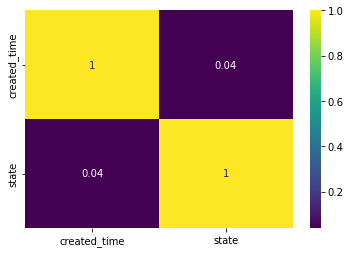

In [20]:
sns.heatmap(transac.corr().round(2), annot=True, cmap='viridis')
plt.show()

_Знову ж таки теплова карта із таблицею "transac" не несе великого інформаційного навантаження, оскільки всі стовпці, крім двох мають формат  object, і дані потребують подальшої обробки._

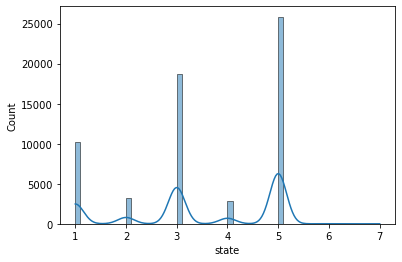

In [20]:
sns.histplot(ccsubs['state'], kde=True)
plt.show()

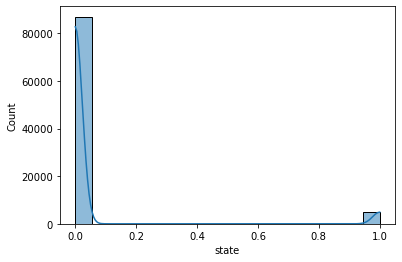

In [22]:
sns.histplot(transac['state'], kde=True)
plt.show()

_Крім того, на графіку histplot видно, що дані мають не рівномірний розподіл. Так у підписках явно переважать значення за закодованими цифрами 1, 3, 5, а у транзакціях наші ризикові операції (1) мають набагато меншу кількість ніж інші (0)._

## >Попередня обробка даних

_Необхідно об'єднати набори даних Атрибути користувачів (df1, df2, df3, df4, df5) у один дата-фрейм. Оскільки за умовою завдання користувач ідентифікується як ClientID і GUID (a PC unique stamp, usually 1 pc = 1 user), то є сенс об'єднувати саме за колонками ClientID і GUID. Оскільки набори даних df1, df2, df3, df4, df5 мають однакову кількість колонок і повністю співпадають за їх назвами, тому є сенс об'єднати дані набори в один простим конкатуванням за допомогою функціх concat._

#### Виведення кількості стовпців і рядків у дата-фреймах

In [23]:
df1.shape

(3747, 148)

In [24]:
df2.shape

(4659, 148)

In [25]:
df3.shape

(4055, 148)

In [26]:
df4.shape

(5116, 148)

In [19]:
df5.shape

(3848, 148)

#### Об'єднання

In [20]:
df_users = pd.concat([df1, df2, df3, df4, df5])

In [21]:
df_users.shape

(21425, 148)

_Що стосується об'єднання дата-фреймів транзакцій і підписок, то за умовою задачі "Кожна транзакція створює об’єкт підписки", що для мене не зовсім є однозначним, оскільки в реальності транзакція не завжди повинна створювати підписку, але можливо це є обов'язковою умовою для банку і тому вважатиму, що так воно і є. Однак кількість підписок менша ніж транзакцій. З даного можна зробити висновок, що скоріш за все, ті транзакції, які не пройшли або заблоковоні, не створюють підписку._ 

#### Виведення кількості стовпців і рядків у дата-фреймах

In [78]:
transac.shape

(92167, 19)

In [79]:
ccsubs.shape

(60932, 18)

#### Об'єднання транзакцій і підписок

_Оскільки кожна транзакція створює об’єкт підписки, то скоріш за все колонка 'subscription_id' у таблиці підписок є ключем до колонки 'id' у транзакціях, тому є сенс об'єднувати таблиці з внутрішнім об'єднанням._ 

In [22]:
merged_transac_ccsubs = pd.merge(transac, ccsubs, left_on='subscription_id', right_on='id', how='inner')

In [23]:
merged_transac_ccsubs.shape

(59075, 37)

#### Об'єднання усіх таблиць

In [24]:
df_users.head()

,id,referrer,src_domain,src_url,campaign_last,campaign_first,at,ai,same_campaign,campaign_visits,...,user_agent,ip,geo,ip_city,ip_state_iso,ip_state_name,ip_tz,ip_tzo,risk,d
0,4568921,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15) ...,24.140.168.18,US,Massillon,OH,Ohio,America/New_York,240,{},200210
1,4569179,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (Windows NT 10.0; Win64; x64) Appl...,92.5.101.53,GB,Doncaster,DNC,Doncaster,Europe/London,-60,{},200210
2,4569217,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,86.162.82.27,GB,Morpeth,NBL,Northumberland,Europe/London,-60,{},200210
3,4337476,-,NaN,NaN,NaN,NaN,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,73.53.100.16,US,Auburn,WA,Washington,America/Los_Angeles,420,{},200210
4,4569451,-,NaN,NaN,activeTrail,activeTrail,NaN,NaN,0,0,...,Mozilla/5.0 (iPhone; CPU iPhone OS 13_3_1 like...,73.206.136.220,US,Houston,TX,Texas,America/Chicago,300,{},200210


In [26]:
merged_transac_ccsubs.head()

,id_x,customer_id_x,subscription_id,guid_x,email,geo,amount_x,returns,item_name,item_key,...,amount_y,ltv,interval_sec,retry_count,descriptor_y,meta_data,log_json,strategy_id_y,strategy_config_y,state_y
0,33873,111026,10002,1A9E5D74-029A-11EA-80DB-F875A4280B62,email@gmail.com,CA,9.99,0.0,Fast! - 1 PC monthly,fast_1pc_1m,...,9.99,189.85,2592000,1,PCAppStore:Fast,"{""guid"": ""1A9E5D74-029A-11EA-80DB-F875A4280B62...","[\n {\n ""time"": 1607260470,\n ...",NaN,{},1
1,35852,111026,10002,1A9E5D74-029A-11EA-80DB-F875A4280B62,email@gmail.com,CA,9.99,0.0,Fast! - 1 PC monthly,fast_1pc_1m,...,9.99,189.85,2592000,1,PCAppStore:Fast,"{""guid"": ""1A9E5D74-029A-11EA-80DB-F875A4280B62...","[\n {\n ""time"": 1607260470,\n ...",NaN,{},1
2,37918,111026,10002,1A9E5D74-029A-11EA-80DB-F875A4280B62,email@gmail.com,CA,9.99,0.0,Fast! - 1 PC monthly,fast_1pc_1m,...,9.99,189.85,2592000,1,PCAppStore:Fast,"{""guid"": ""1A9E5D74-029A-11EA-80DB-F875A4280B62...","[\n {\n ""time"": 1607260470,\n ...",NaN,{},1
3,40522,111026,10002,1A9E5D74-029A-11EA-80DB-F875A4280B62,email@gmail.com,CA,9.99,0.0,Fast! - 1 PC monthly,fast_1pc_1m,...,9.99,189.85,2592000,1,PCAppStore:Fast,"{""guid"": ""1A9E5D74-029A-11EA-80DB-F875A4280B62...","[\n {\n ""time"": 1607260470,\n ...",NaN,{},1
4,42800,111026,10002,1A9E5D74-029A-11EA-80DB-F875A4280B62,email@gmail.com,CA,9.99,0.0,Fast! - 1 PC monthly,fast_1pc_1m,...,9.99,189.85,2592000,1,PCAppStore:Fast,"{""guid"": ""1A9E5D74-029A-11EA-80DB-F875A4280B62...","[\n {\n ""time"": 1607260470,\n ...",NaN,{},1


_Дотримуючись того самого правила завдання (кожна транзакція створює об’єкт підписки), то скоріш за все колонка 'subscription_id' у обєднаній таблиці підписок з транзакціями повинна бути ключем до колонки 'id' у таблиці з користувачами, тому є сенс об'єднувати таблиці з правим об'єднанням._ 

In [25]:
merged_all= pd.merge(df_users, merged_transac_ccsubs, left_on='id', right_on='subscription_id', how='right')

In [26]:
merged_all.shape

(59075, 185)

In [27]:
merged_all.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59075 entries, 0 to 59074
Columns: 185 entries, id to state_y
dtypes: float64(88), int64(9), object(88)
memory usage: 83.8+ MB


### Аналіз отриманих даних, перетворення форматів, відкидання неінформативних колонок

_На даному етапі необхідно проаналізувати дані з метою визначення ризикових транзакцій та відповідні їм підписки та атрибути користувачів. Потрібно проаналізувати дані, щоб визначити, які фактори могли сприяти відкликанню платежів. Необхідно шукати закономірності та тенденції, які можуть свідчити про шахрайство або інші фактори, що підвищують ризик повернення платежу._

#### Виведення пропущених значень у відсотках  по усім колонкам

In [28]:
merged_all.isna().sum().div(merged_all.shape[0]).mul(100).round(2)[:60]

id                         99.63
referrer                   99.65
src_domain                 99.66
src_url                    99.66
campaign_last              99.67
campaign_first             99.66
at                         99.67
ai                         99.98
same_campaign              99.63
campaign_visits            99.63
campaign_visits_pre        99.63
kw                         99.98
campaign_platform_last     99.89
campaign_platform_first    99.89
tpm                        99.63
cpc                        99.63
dm                         99.63
fbclid                     99.99
gclid                      99.97
msclkid                    99.98
lp_last                    99.65
lp_last_time               99.63
lp_last_dow                99.63
lp_last_hr                 99.63
lp_first                   99.63
lp_first_time              99.63
lp_first_dow               99.63
lp_first_hr                99.63
lp_time_diff               99.63
same_lp                    99.63
visit     

In [293]:
merged_all.isna().sum().div(merged_all.shape[0]).mul(100).round(2)[61:121]

gpu_name                   99.63
gpu_x                      99.63
gpu_y                      99.63
sec_as                     99.87
sec_av                     99.87
sec_fw                     99.96
bios_releasedate           99.87
dsk_name                   99.65
dsk_size                   99.63
dsk_iosec                  99.63
dsk_mbsec                  99.63
inst_browser              100.00
web_vistype_browser        99.94
web_vistype_browserver     99.94
web_vistype_os             99.94
web_vistype_gpu            99.94
web_vistype_x              99.94
web_vistype_y              99.94
web_tzo                    99.97
usage                      99.97
usage_ml                   99.97
clientid                   99.94
paid                       99.63
paid_count                 99.63
ltv_x                      99.63
fa_offers                  99.63
payment_last_time          99.63
payment_last_dow           99.63
payment_last_hr            99.63
payment_last_amount        99.63
payment_fi

In [29]:
merged_all.isna().sum().div(merged_all.shape[0]).mul(100).round(2)[122:182]

fa_install           99.63
fa_installed         99.63
fa_version_last      99.98
fa_version_first     99.98
fa_uninstalled       99.63
inst_apps            99.63
pc_processes         99.63
pc_software          99.63
pc_hardware          99.63
fa_config            99.63
fa_strategy          99.63
fa_profile           99.63
fa_menustore         99.98
guid                 99.63
fcid                 99.83
event_last_time      99.63
user_agent           99.97
ip                   99.63
geo_x                99.63
ip_city              99.64
ip_state_iso         99.64
ip_state_name        99.64
ip_tz                99.63
ip_tzo               99.63
risk                 99.63
d                    99.63
id_x                  0.00
customer_id_x         0.00
subscription_id       0.00
guid_x                0.00
email                 1.34
geo_y                 0.08
amount_x              0.00
returns               0.00
item_name             0.00
item_key              1.28
campaign             14.80
c

In [296]:
merged_all.isna().sum().div(merged_all.shape[0]).mul(100).round(2)[182:185]

strategy_id_y        30.83
strategy_config_y     0.00
state_y               0.00
dtype: float64

_У результаті аналізу вбачажться, що об'єднання було не зовсім вірним, оскільки колонки з таблиці користувачім майже на 100% заповнені пропущеними значеннями. Виходячи з цього та з метою побудови моделі для пошуку ризикових операцій,  колонки з кількістю >99% пропусків вирішено прибрати._

In [30]:
print(list(merged_all.columns[:148]))

['id', 'referrer', 'src_domain', 'src_url', 'campaign_last', 'campaign_first', 'at', 'ai', 'same_campaign', 'campaign_visits', 'campaign_visits_pre', 'kw', 'campaign_platform_last', 'campaign_platform_first', 'tpm', 'cpc', 'dm', 'fbclid', 'gclid', 'msclkid', 'lp_last', 'lp_last_time', 'lp_last_dow', 'lp_last_hr', 'lp_first', 'lp_first_time', 'lp_first_dow', 'lp_first_hr', 'lp_time_diff', 'same_lp', 'visit', 'entry_app', 'download', 'download_last_time', 'download_first_time', 'download_dur_time', 'installing_page', 'install_mini_start', 'install_mini_start_time', 'install_start', 'install_start_time', 'version_last', 'product_config_last', 'version_first', 'product_config_first', 'same_version', 'installed', 'install_count', 'cogs', 'os_name', 'os_installdate', 'os_processes', 'os_architecture', 'os_mem', 'os_virtmem', 'cpu_name', 'cpu_maxclock', 'cpu_cores', 'cpu_logicalproc', 'pc_vendor', 'pc_version', 'gpu_name', 'gpu_x', 'gpu_y', 'sec_as', 'sec_av', 'sec_fw', 'bios_releasedate', 'd

In [31]:
merged_all.drop(columns=['id', 'referrer', 'src_domain', 'src_url', 'campaign_last', 'campaign_first', 
                             'at', 'ai', 'same_campaign', 'campaign_visits', 'campaign_visits_pre', 'kw', 
                             'campaign_platform_last', 'campaign_platform_first', 'tpm', 'cpc', 'dm', 'fbclid', 
                             'gclid', 'msclkid', 'lp_last', 'lp_last_time', 'lp_last_dow', 'lp_last_hr', 'lp_first', 
                             'lp_first_time', 'lp_first_dow', 'lp_first_hr', 'lp_time_diff', 'same_lp', 'visit', 
                             'entry_app', 'download', 'download_last_time', 'download_first_time', 'download_dur_time', 
                             'installing_page', 'install_mini_start', 'install_mini_start_time', 'install_start', 
                             'install_start_time', 'version_last', 'product_config_last', 'version_first', 
                             'product_config_first', 'same_version', 'installed', 'install_count', 'cogs', 
                             'os_name', 'os_installdate', 'os_processes', 'os_architecture', 'os_mem', 'os_virtmem', 
                             'cpu_name', 'cpu_maxclock', 'cpu_cores', 'cpu_logicalproc', 'pc_vendor', 'pc_version', 
                             'gpu_name', 'gpu_x', 'gpu_y', 'sec_as', 'sec_av', 'sec_fw', 'bios_releasedate', 
                             'dsk_name', 'dsk_size', 'dsk_iosec', 'dsk_mbsec', 'inst_browser', 'web_vistype_browser', 
                             'web_vistype_browserver', 'web_vistype_os', 'web_vistype_gpu', 'web_vistype_x', 
                             'web_vistype_y', 'web_tzo', 'usage', 'usage_ml', 'clientid', 'paid', 'paid_count', 
                             'ltv_x', 'fa_offers', 'payment_last_time', 'payment_last_dow', 'payment_last_hr', 
                             'payment_last_amount', 'payment_first_time', 'payment_first_dow', 'payment_first_hr', 
                             'refunded', 'refunded_time', 'refunded_dow', 'refunded_hr', 'reg_partial', 'reg_full', 
                             'uninstalled', 'uninstalled_last_time', 'uninstalled_last_dow', 'uninstalled_last_hr', 
                             'uninstalled_first_time', 'uninstalled_first_dow', 'uninstalled_first_hr', 
                             'web_uninstall_reason', 'uninstalled_comment', 'survey_no', 'survey_yes', 'cpg', 
                             'mail_sending', 'mail_subject', 'email_last_time', 'email_first_time', 'mail_sent', 
                             'mail_open', 'mail_bounce', 'mail_blocked', 'mail_unsub', 'mail_spam', 'fa_install', 
                             'fa_installed', 'fa_version_last', 'fa_version_first', 'fa_uninstalled', 'inst_apps', 
                             'pc_processes', 'pc_software', 'pc_hardware', 'fa_config', 'fa_strategy', 'fa_profile', 
                             'fa_menustore', 'guid', 'fcid', 'event_last_time', 'user_agent', 'ip', 'geo_x', 
                             'ip_city', 'ip_state_iso', 'ip_state_name', 'ip_tz', 'ip_tzo', 'risk', 'd'], inplace=True)

#### Виведення  назв, пропусків та типів усіх колонок у отриманній таблиці

In [32]:
merged_all.isna().sum().div(merged_all.shape[0]).mul(100).round(2)

id_x                  0.00
customer_id_x         0.00
subscription_id       0.00
guid_x                0.00
email                 1.34
geo_y                 0.08
amount_x              0.00
returns               0.00
item_name             0.00
item_key              1.28
campaign             14.80
created_time_x        0.00
provider              0.00
oid                  38.42
descriptor_x         13.27
strategy_id_x        30.87
strategy_config_x     0.00
json                  0.00
state_x               0.00
id_y                  0.00
customer_id_y         0.00
guid_y                0.00
page                  1.35
shopper_id            3.63
created_time_y        0.00
last_billing_time     0.00
next_billing_time     0.00
amount_y              0.00
ltv_y                 0.00
interval_sec          0.00
retry_count           0.00
descriptor_y          2.48
meta_data             0.00
log_json              0.00
strategy_id_y        30.83
strategy_config_y     0.00
state_y               0.00
d

In [33]:
merged_all.dtypes

id_x                  object
customer_id_x         object
subscription_id       object
guid_x                object
email                 object
geo_y                 object
amount_x              object
returns               object
item_name             object
item_key              object
campaign              object
created_time_x       float64
provider              object
oid                   object
descriptor_x          object
strategy_id_x         object
strategy_config_x     object
json                  object
state_x                int64
id_y                   int64
customer_id_y          int64
guid_y                object
page                  object
shopper_id           float64
created_time_y         int64
last_billing_time      int64
next_billing_time      int64
amount_y             float64
ltv_y                float64
interval_sec           int64
retry_count            int64
descriptor_y          object
meta_data             object
log_json              object
strategy_id_y 

#### Перетворення формату

_Оскільки багато колонок по факту у числовому форматі, але через 1 або декілька значень у форматі object, дана колонка вся відображається у форматі object, тому для автоматичного перекодування даних з формату object на формат float64 або int64 використа метод to_numeric() з параметром errors='coerce'._

In [34]:
merged_all['id_x'] = pd.to_numeric(merged_all['id_x'], errors='coerce')

In [35]:
merged_all['customer_id_x'] = pd.to_numeric(merged_all['customer_id_x'], errors='coerce')

In [36]:
merged_all['subscription_id'] = pd.to_numeric(merged_all['subscription_id'], errors='coerce')

In [37]:
merged_all['amount_x'] = pd.to_numeric(merged_all['amount_x'], errors='coerce')

In [38]:
merged_all['returns'] = pd.to_numeric(merged_all['returns'], errors='coerce')

In [39]:
merged_all['amount_x'] = pd.to_numeric(merged_all['amount_x'], errors='coerce')

_Після аналізу даних, стає зрозумілим, що більшість стовпців з типом даних object є не цікавими (такі, що не впливають на поверненням платежу), а доволі цікавими  стовпці наприклад з назвою 'geo_y'. Іх категоріальні значення хотів перетворити у цифрові за допомогою OneHotEncoder, однак виникала помилка з пам'ятю. Ось приклад із стовпцем "geo_y"._

In [40]:
merged_all['geo_y'].unique() # Виведення унікальних значень у даному стовці 

array(['CA', 'US', 'AU', 'DE', 'GB', 'KR', 'SE', 'BR', 'MX', 'IE', 'IN',
       'SA', 'GR', 'BD', 'AE', 'BG', 'CY', 'CH', 'AR', 'CN', 'AT', 'ZA',
       'NG', nan, 'PA', 'TR', 'NZ', 'HR', 'ZW', 'IT', 'PT', 'PH', 'BW',
       'FR', 'IS', 'JM', 'PR', 'BE', 'PG', 'DK', 'JP', 'ID', 'RO', 'NO',
       'BM', 'GH', 'ES', 'GT', 'NL', 'HK', 'TZ', 'UA', 'IL', 'SV', 'SG',
       'AO', 'FI', 'TL', 'VI', 'BZ', 'VN', 'AG', 'PK', 'TH', 'CO', 'HN',
       'EG', 'HU', 'BS', 'BF', 'CM', 'QA', 'TW', 'PW', 'EC', 'NP', 'CK',
       'DO', 'CR', 'MA', 'PE', 'MY', 'SL', 'OM', 'UG', 'IR', 'VG', 'TC',
       'CL', 'MM', 'TD', 'PS', 'PL', 'VE', 'KW', 'KE'], dtype=object)

In [46]:
# Створюю об'єкт OneHotEncoder
encoder = OneHotEncoder()

# Створив масив значень зі стовпця "kw"
kw_values = merged_all['geo_y'].values.reshape(-1, 1)

# Перекодовую стовпець "kw" з використанням OneHotEncoder
onehot_encoded = encoder.fit_transform(kw_values)

# Отримую матрицю OneHotEncoder у вигляді NumPy ndarray
onehot_encoded_array = onehot_encoded.toarray()

# Створюю DataFrame з перекодованим стовпцем "kw"
encoded_df = pd.DataFrame(onehot_encoded_array, columns=encoder.get_feature_names(['geo_y']))

# Додаю DataFrame з перекодованим стовпцем "kw" до початкової таблиці
merged_all = pd.concat([merged_all, encoded_df], axis=1)

C:\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


_Виходячи із цього прийняв рішення відкинути решту стовпців у форматі 'object'._

#### Відкидання стовпців із типом 'object'

In [41]:
merged_all_new=merged_all.select_dtypes(exclude=['object'])
merged_all_new

,id_x,customer_id_x,subscription_id,amount_x,returns,created_time_x,state_x,id_y,customer_id_y,shopper_id,created_time_y,last_billing_time,next_billing_time,amount_y,ltv_y,interval_sec,retry_count,state_y
0,33873,111026,10002,9.99,0.0,1.625406e+09,0,10002,111026,201695808.0,1607260472,1646143200,1646316000,9.99,189.85,2592000,1,1
1,35852,111026,10002,9.99,0.0,1.627998e+09,0,10002,111026,201695808.0,1607260472,1646143200,1646316000,9.99,189.85,2592000,1,1
2,37918,111026,10002,9.99,0.0,1.630590e+09,0,10002,111026,201695808.0,1607260472,1646143200,1646316000,9.99,189.85,2592000,1,1
3,40522,111026,10002,9.99,0.0,1.633182e+09,0,10002,111026,201695808.0,1607260472,1646143200,1646316000,9.99,189.85,2592000,1,1
4,42800,111026,10002,9.99,0.0,1.635775e+09,0,10002,111026,201695808.0,1607260472,1646143200,1646316000,9.99,189.85,2592000,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59070,96024,256603,64874,11.99,0.0,1.668089e+09,0,64874,256603,383743812.0,1668088573,1668088573,1670680576,11.99,11.99,2592000,0,4
59071,96025,2,64875,59.99,0.0,1.668089e+09,0,64875,2,379835214.0,1668088897,1668088897,0,59.99,0.00,0,0,3
59072,96027,255846,64876,79.99,0.0,1.668089e+09,0,64876,255846,384236954.0,1668089279,1668089282,0,79.99,79.99,0,0,5
59073,96029,217823,64878,95.99,0.0,1.668090e+09,0,64878,217823,290182096.0,1668090157,1668090157,0,95.99,0.00,0,0,3


#### Виведення пропущених значень у відсотках  по усім колонкам

In [42]:
merged_all_new.isna().sum().div(merged_all_new.shape[0]).mul(100).round(2)

id_x                 0.00
customer_id_x        0.00
subscription_id      0.00
amount_x             0.00
returns              0.00
created_time_x       0.00
state_x              0.00
id_y                 0.00
customer_id_y        0.00
shopper_id           3.63
created_time_y       0.00
last_billing_time    0.00
next_billing_time    0.00
amount_y             0.00
ltv_y                0.00
interval_sec         0.00
retry_count          0.00
state_y              0.00
dtype: float64

##### Аналіз колонок з пропущеними значеннями

In [43]:
merged_all_new['shopper_id'].unique()

array([2.01695808e+08, 2.31759928e+08, 2.08763152e+08, ...,
       3.84208036e+08, 3.84232308e+08, 3.84236954e+08])

_Для даної колонки, бачу, що відсоток пропущених значень не великий, тому замінюю їх на а найчастіше зустрічаюче значення  колонки._

In [44]:
merged_all_new['shopper_id'] = merged_all_new['shopper_id'].fillna(merged_all_new['shopper_id'].mode()[0])

In [45]:
merged_all_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59075 entries, 0 to 59074
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   id_x               59075 non-null  int64  
 1   customer_id_x      59075 non-null  int64  
 2   subscription_id    59075 non-null  int64  
 3   amount_x           59075 non-null  float64
 4   returns            59075 non-null  float64
 5   created_time_x     59075 non-null  float64
 6   state_x            59075 non-null  int64  
 7   id_y               59075 non-null  int64  
 8   customer_id_y      59075 non-null  int64  
 9   shopper_id         59075 non-null  float64
 10  created_time_y     59075 non-null  int64  
 11  last_billing_time  59075 non-null  int64  
 12  next_billing_time  59075 non-null  int64  
 13  amount_y           59075 non-null  float64
 14  ltv_y              59075 non-null  float64
 15  interval_sec       59075 non-null  int64  
 16  retry_count        590

## Виведеня основної статестичної інформації отриманої підсумкової таблиці

In [47]:
merged_all_new.describe(include='all').T

,count,mean,std,min,25%,50%,75%,max
id_x,59075.0,6.529424e+04,1.794579e+04,3.387300e+04,4.977750e+04,6.540600e+04,8.093550e+04,9.603000e+04
customer_id_x,59075.0,2.053256e+05,5.151404e+04,2.000000e+00,2.047540e+05,2.164330e+05,2.439470e+05,2.568050e+05
subscription_id,59075.0,3.565313e+04,1.658389e+04,3.700000e+01,2.193600e+04,3.602600e+04,4.954450e+04,6.487900e+04
amount_x,59075.0,3.385086e+01,4.635604e+01,0.000000e+00,9.990000e+00,9.990000e+00,4.999000e+01,4.399900e+02
returns,59075.0,3.502136e+00,2.067534e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.399900e+02
created_time_x,59075.0,1.650971e+09,1.199208e+07,1.625406e+09,1.642285e+09,1.652321e+09,1.661818e+09,1.668090e+09
state_x,59075.0,6.078713e-02,2.389415e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
id_y,59075.0,3.565313e+04,1.658389e+04,3.700000e+01,2.193600e+04,3.602600e+04,4.954450e+04,6.487900e+04
customer_id_y,59075.0,2.053293e+05,5.151543e+04,2.000000e+00,2.047540e+05,2.164340e+05,2.439470e+05,2.568050e+05
shopper_id,59075.0,2.648764e+08,7.991701e+07,3.576188e+07,2.089211e+08,2.817710e+08,3.310782e+08,3.842370e+08


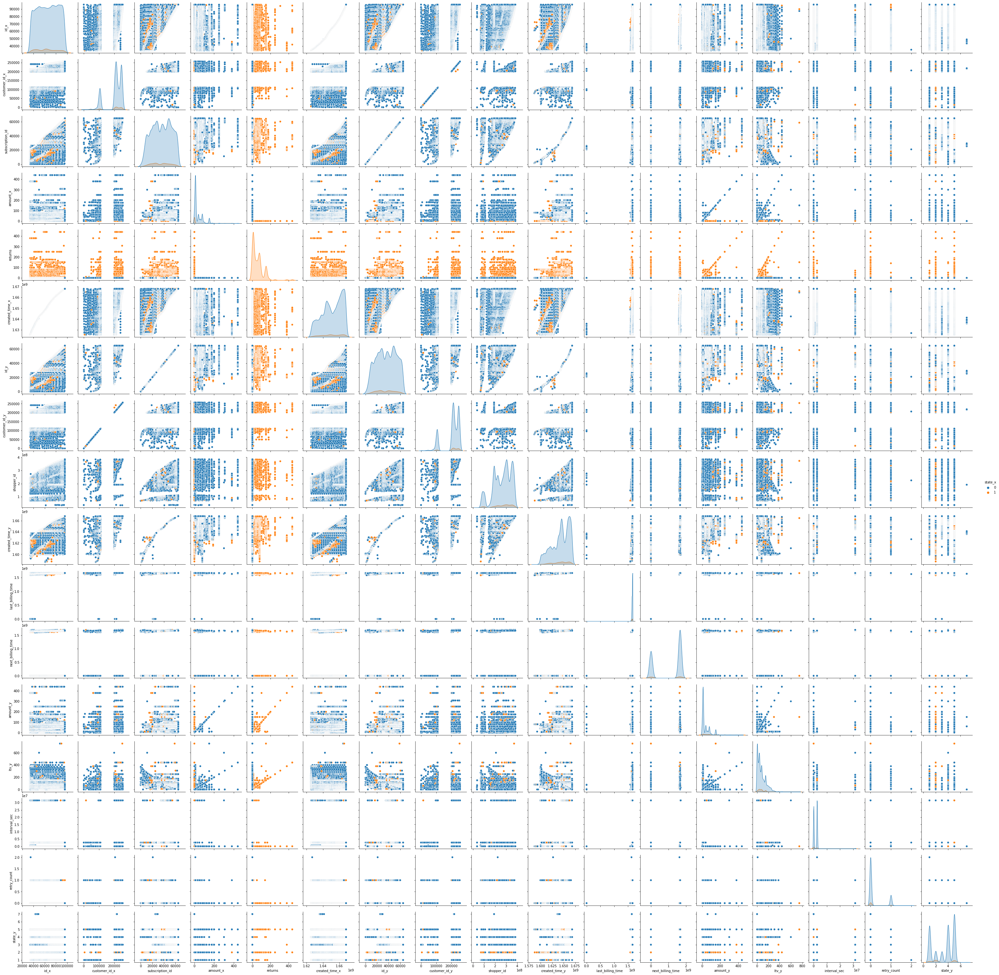

In [337]:
sns.pairplot(merged_all_new, hue='state_x')
plt.show() 

_Помаранчевим кольром відображені ризиковані операції (були замарковані на початку "1") і можна прослідкувати взаємозвязки з іншими стовпчиками._

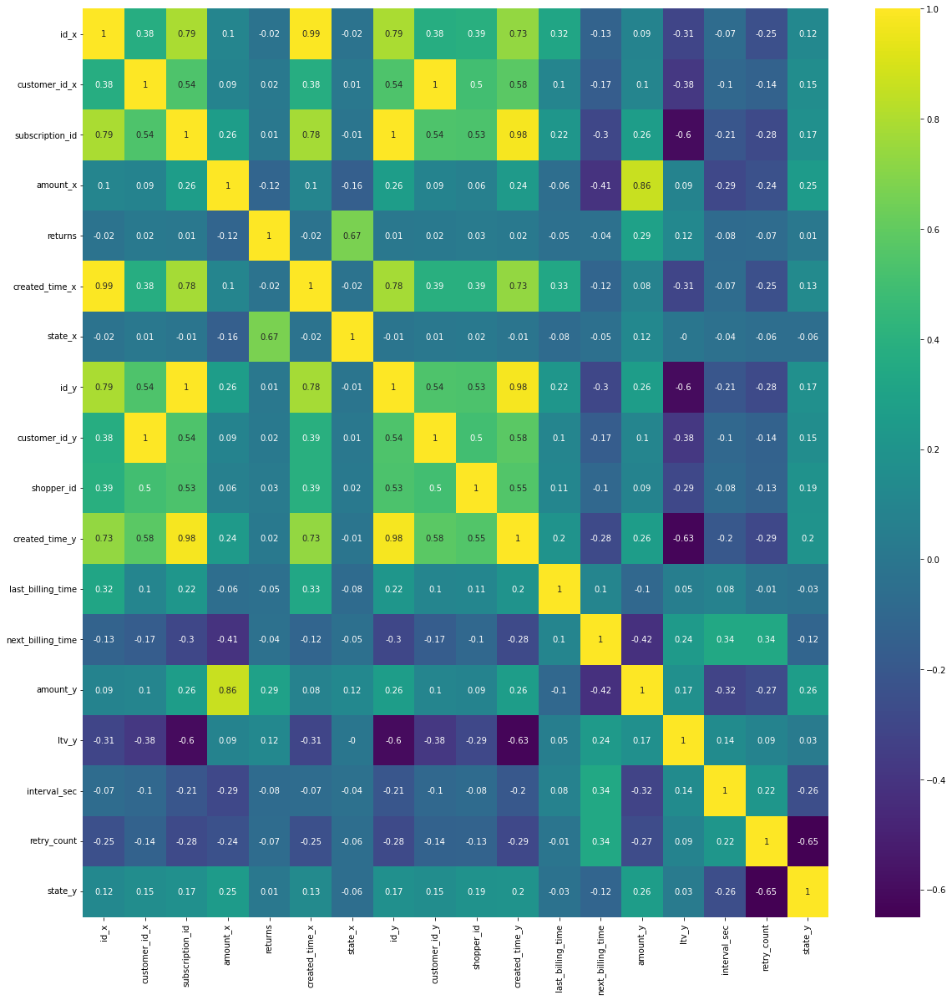

In [340]:
plt.figure(figsize=(20, 20))
sns.heatmap(merged_all_new.corr().round(2), annot=True, cmap='viridis')
plt.show()

_Теплова карта кореляції показує лінійну залежність, можемо побачити стовпці, які найбільше корелюють (жовтий колір і значення наближається до 1). Варто звернути увагу, що деякі пари стовпців мають від'ємну кореляцію. Цікавами спостерігати за кореляцією цільової змінної з іншими стовпцями, а саме які мають більшу, а які меншу кореляцію_.

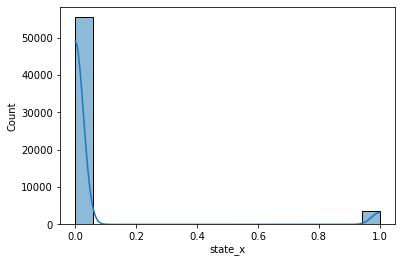

In [338]:
sns.histplot(merged_all_new['state_x'], kde=True)
plt.show()

_На графіку histplot видно, що дані цільової змінної залишається не рівномірний розподіл відносно загальної кількості._

<AxesSubplot:xlabel='state_x', ylabel='count'>

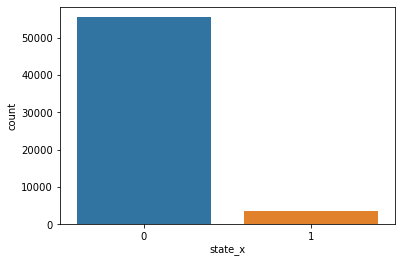

In [46]:
sns.countplot(x="state_x", data=merged_all_new)

_Дана візуалізація демонструє спыввыдношення ризикових операцый ("1") до всых ынших._

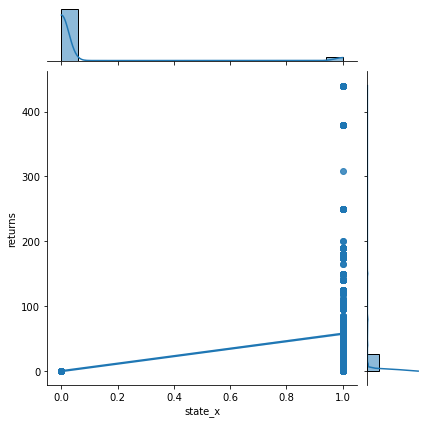

In [49]:
sns.jointplot(x = 'state_x', y = 'returns', data = merged_all_new,  kind='reg')
plt.show()

_За дпомогою даних графыкыв можна відобразити тенденціъ між цільовою змінною (target) та рызними признаками ('returns' взято як приклад)._

## На мій погляд, для вирішення задачі пошуку ризикованих транзакцій, які стануть поверненням платежів, можна використати модель машинного навчання класифікації.

_Дані ділю за цільвою змінною 'state_x'._

In [47]:
X = merged_all_new.drop(columns=['state_x']).dropna(axis=1)
y = merged_all_new['state_x']

## Побудова простої логістичної регресії

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

# accuracy - % правильно "вгаданих" значень 
print('Score на трейні', logmodel.score(X_train,y_train))
print('Score на тесті', logmodel.score(X_test,y_test))

Score на трейні 0.9388118990655893
Score на тесті 0.9394678041844404


_Побудова моделі простої логістичної регресії показала доволі непоганий результат, при чому результат на тесті трохи вищий._

## Побудова логістичної регресії з маштабуванням 

In [50]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

logmodel = make_pipeline(MinMaxScaler(), LogisticRegression())

logmodel.fit(X_train,y_train)

# accuracy - % правильно "вгаданих" значень 
print('Score на трейні', logmodel.score(X_train,y_train))

print('Score на тесті', logmodel.score(X_test,y_test))

Score на трейні 0.97151627319099
Score на тесті 0.9725099871352156


C:\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


_Побудова моделі логістичної регресії з масштабуванням показала набагато кращий результат, при чому результат на тесті трохи вищий._

## Оскільки у нас є ризикові транзакції та всі інші, тобто позитивні і негативні значення, то на мій погляд для вирішення даної задачі достатньо побудувати модель Баївсівського класифікатора 

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

logmodel = GaussianNB()
logmodel.fit(X_train,y_train)

# accuracy - % правильно "вгаданих" значень 
print('Score на трейні', logmodel.score(X_train,y_train))
print('Score на тесті', logmodel.score(X_test,y_test))

Score на трейні 0.9354037827833702
Score на тесті 0.9367594285327375


_Як бачимо результат ще гірший ніж на базовій моделі простої логістичної регресії._

## Саме тому будую складнішу модель, на приклад на основі дерев рішень

In [52]:
model = DecisionTreeClassifier()

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

model.fit(X_train, y_train)

DecisionTreeClassifier()

In [53]:
model.score(X_test, y_test)

0.9995937436522445

In [54]:
scores = cross_val_score(estimator=DecisionTreeClassifier(max_depth=5), X=X, y=y, scoring='accuracy', cv=5)
print(scores)
print(scores.mean())

[0.99052052 0.9946678  0.95979687 0.99619128 0.99983072]
0.9882014388489209


In [355]:
for i in range(1, 30):
    m = DecisionTreeClassifier(max_depth=i)
    scores = cross_val_score(estimator=m, X=X, y=y, scoring='accuracy', cv=5)
    print(i, '\t', scores.mean())

1 	 0.9958865848497673
2 	 0.9958865848497673
3 	 0.9741345746931867
4 	 0.9875074058400338
5 	 0.9882014388489209
6 	 0.9819043588658486
7 	 0.9821921286500211
8 	 0.9822429115531104
9 	 0.9825645366060094
10 	 0.9607448159119765
11 	 0.9834955564959798
12 	 0.9697841726618706
13 	 0.9829538721963604
14 	 0.9616419805332205
15 	 0.9491155311045281
16 	 0.9692763436309775
17 	 0.9496402877697842
18 	 0.9699365213711383
19 	 0.9829538721963604
20 	 0.9832754972492594
21 	 0.9620482437579347
22 	 0.9611510791366907
23 	 0.9706474820143886
24 	 0.9821074904782057
25 	 0.9492509521794329
26 	 0.9607617435463395
27 	 0.9614049936521372
28 	 0.9705459162082098
29 	 0.9828015234870927


_Результат Дуже гарний у моделі на основі дерев рішень, проте варто звернути увагу, що з різною кількістю дерев результат відрізняється_.

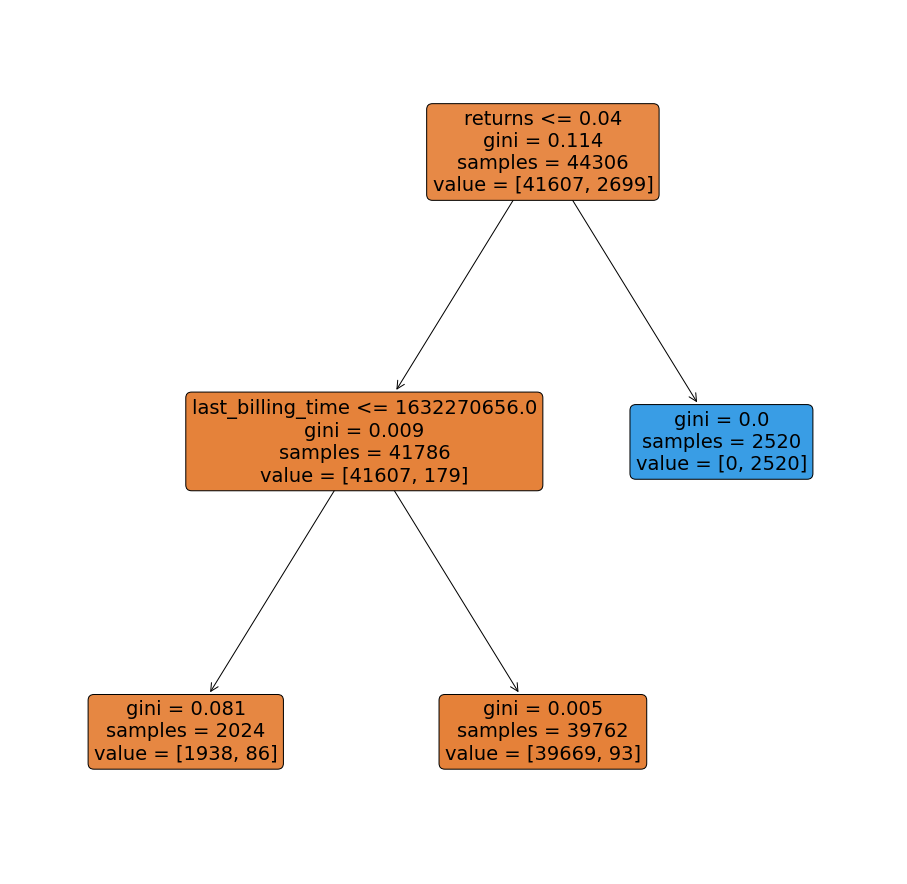

In [55]:
model = DecisionTreeClassifier(max_depth=2)
model.fit(X_train, y_train)

plt.figure(figsize=(16,16))
plot_tree(model, feature_names=X.columns, filled=True,  rounded=True)
plt.show()

# Висновок: дану модель можна використовувати для прогнозування ризикованих транзакцій на основі вхідних даних про нові транзакції та підписки. Модель буде класифікувати кожну транзакцію як "ризиковану" або "не ризиковану" на основі відповідних характеристик, і тим самим допомагати уникнути повернень платежів.